<a href="https://colab.research.google.com/github/alitavanaali/audio-analysis/blob/main/audio_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Initialisation 

In [ ]:
import librosa
import IPython.display as ipd
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 4))
import librosa.display

<Figure size 864x288 with 0 Axes>

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
audio_data = '/content/drive/MyDrive/m1.mp3'
ipd.Audio(audio_data)

In [ ]:
x, sr = librosa.load(audio_data)

/usr/local/lib/python3.6/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


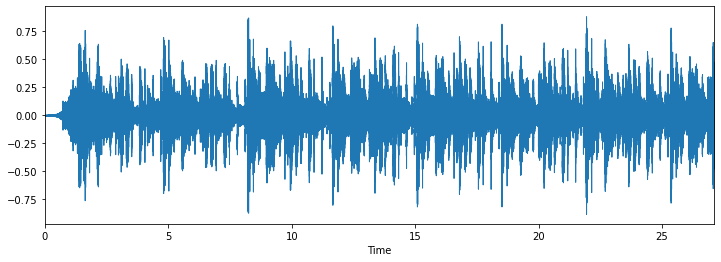

In [ ]:
plt.figure(figsize=(12, 4))
librosa.display.waveplot(x, sr=sr)

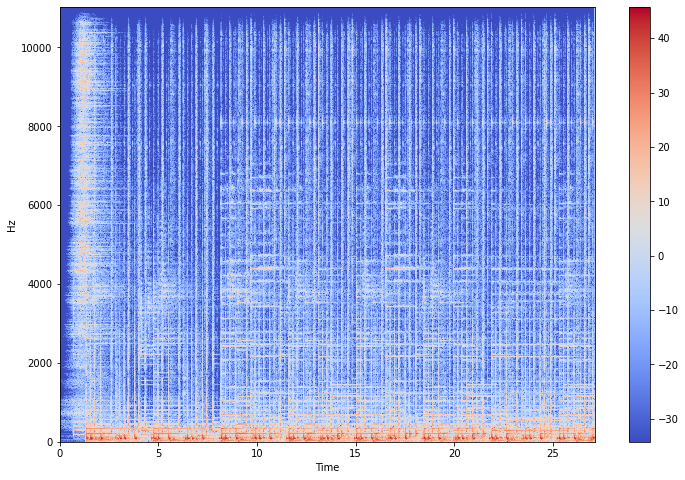

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(12, 8))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

In [ ]:
import numpy as np
sr = 22050 # sample rate
T = 5.0 # seconds
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
x = 0.5 * np.sin(2*np.pi* 220*t) # pure sine wave at 220 Hz

ipd.Audio(x, rate=sr)

## Spectral Centroids
The spectral centroid indicates at which frequency the energy of a spectrum is centered upon or in other words It indicates where the ” center of mass” for a sound is located

(1169,)


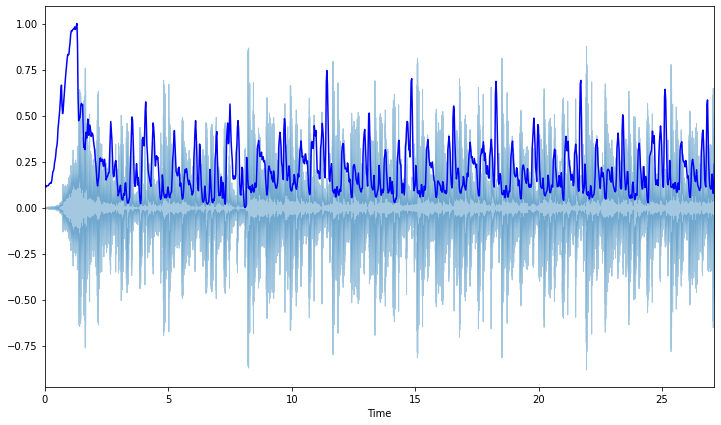

In [ ]:
import sklearn
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
print(spectral_centroids.shape)

# Computing the time variable for visualization
plt.figure(figsize=(12, 7))
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='b')

## Spectral RollOff
It is a measure of the shape of the signal. It represents the frequency at which high frequencies decline to 0. To obtain it, we have to calculate the fraction of bins in the power spectrum where 85% of its power is at lower frequencies.

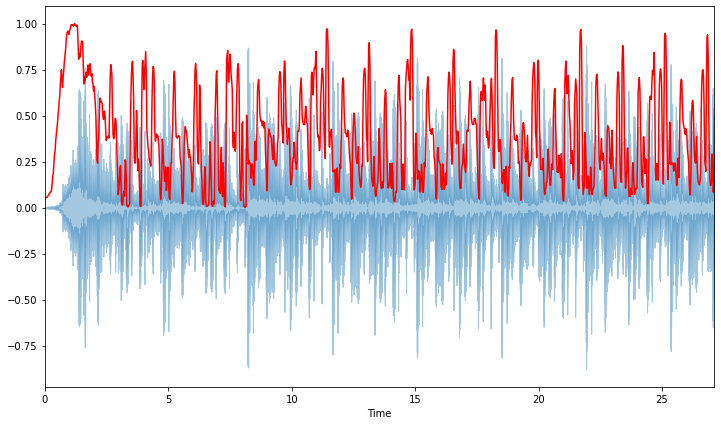

In [ ]:
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
plt.figure(figsize=(12, 7))
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

## Spectral BandWidth
The spectral bandwidth is defined as the width of the band of light at one-half the peak maximum (or full width at half maximum [FWHM]) and is represented by the two vertical red lines and λSB on the wavelength axis
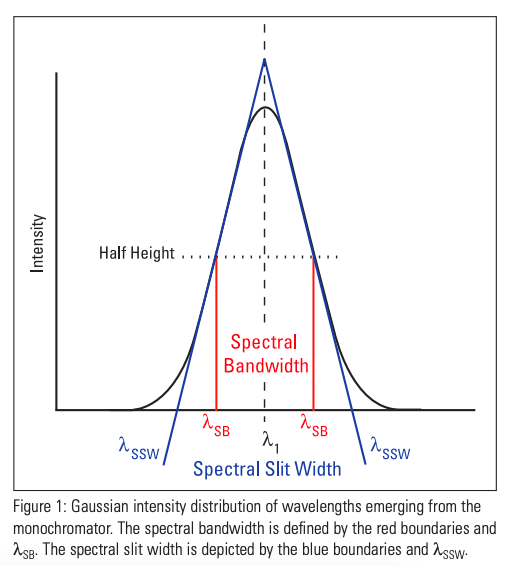

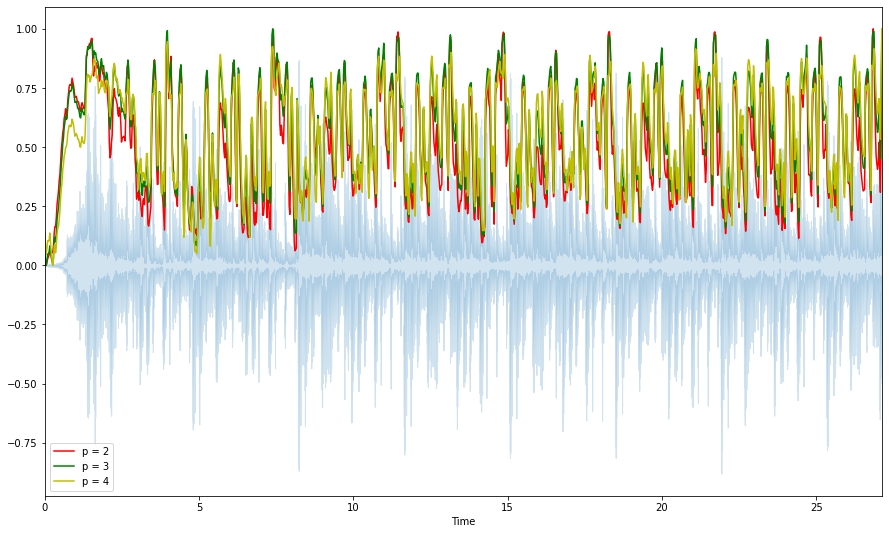

In [ ]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=4)[0]
plt.figure(figsize=(15, 9))
librosa.display.waveplot(x, sr=sr, alpha=0.2)
plt.plot(t, normalize(spectral_bandwidth_2), color='r')
plt.plot(t, normalize(spectral_bandwidth_3), color='g')
plt.plot(t, normalize(spectral_bandwidth_4), color='y')
plt.legend(('p = 2', 'p = 3', 'p = 4'))

## Zero Crossing Rate
A very simple way for measuring the smoothness of a signal is to calculate the number of zero-crossing within a segment of that signal. A voice signal oscillates slowly — for example, a 100 Hz signal will cross zero 100 per second — whereas an unvoiced fricative can have 3000 zero crossings per second.

(598068,)


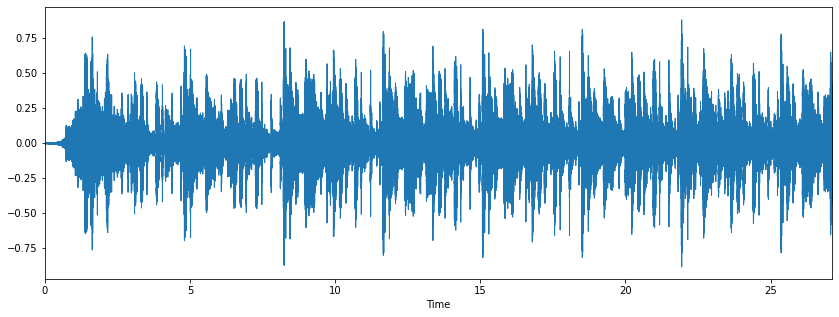

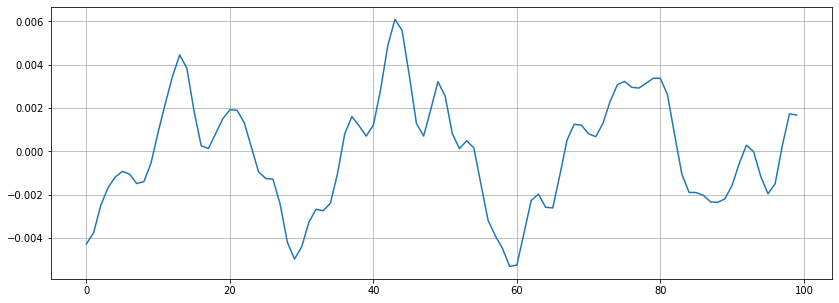

In [ ]:
print(x.shape)
#Plot the signal:
plt.figure(figsize=(14.11, 5))
librosa.display.waveplot(x, sr=sr)
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()

In [ ]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))#9

9


## Chroma Feature
A chroma feature or vector is typically a 12-element feature vector indicating how much energy of each pitch class, {C, C#, D, D#, E, …, B}, is present in the signal. In short, It provides a robust way to describe a similarity measure between music pieces.


In [ ]:
m2_address = '/content/drive/MyDrive/m2.wav'
ipd.Audio(m2_address)

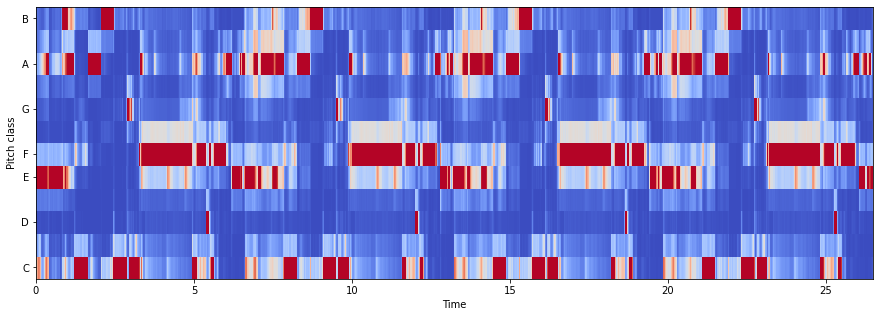

In [ ]:
x_m2, sr_m2 = librosa.load(m2_address);
chromagram = librosa.feature.chroma_stft(x_m2, sr=sr_m2)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma',  cmap='coolwarm')

In [ ]:
cmap = plt.get_cmap('inferno')
plt.figure(figsize=(10,8))
plt.specgram(x_m2, NFFT=2048, Fs=2, Fc=0, noverlap=128, cmap=cmap, sides='default', mode='default', scale='dB');
plt.axis('off');
plt.savefig('m2.png')
plt.clf()

<Figure size 720x576 with 0 Axes>

## Mastered/Dry

In [ ]:
ghazal_dry = '/content/drive/MyDrive/sounds/ghazal-v1-dry.mp3'
ghazal_mastered = '/content/drive/MyDrive/sounds/ghazal-v1-mastered.mp3'
gd, gd_sr = librosa.load(ghazal_dry)
print('Dry: ')
ipd.Audio(ghazal_dry)

/usr/local/lib/python3.6/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Dry: 


In [ ]:
gm, gm_sr = librosa.load(ghazal_mastered)
print('Mastered: ')
ipd.Audio(ghazal_mastered)

/usr/local/lib/python3.6/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Mastered: 


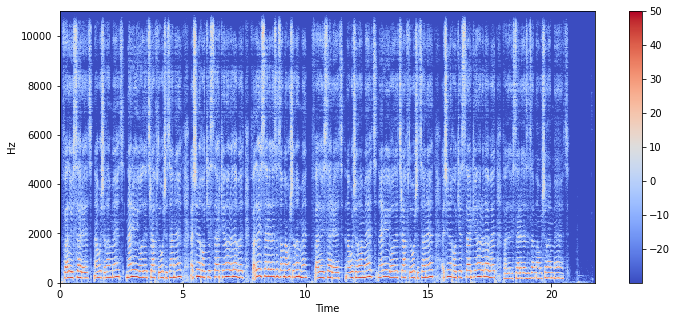

In [ ]:
plt.figure(figsize=(12, 5))
librosa.display.specshow(
    librosa.amplitude_to_db(abs(librosa.stft(gd)))
    , sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

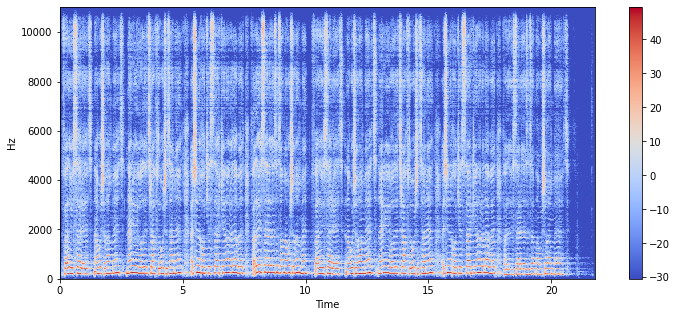

In [ ]:
plt.figure(figsize=(12, 5))
librosa.display.specshow(
    librosa.amplitude_to_db(abs(librosa.stft(gm)))
    , sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

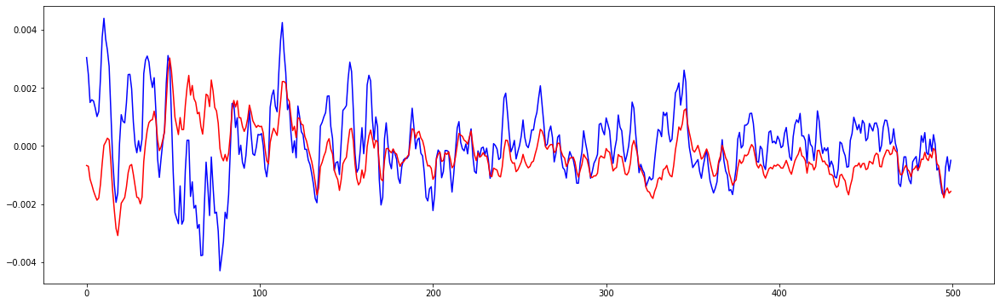

In [ ]:
plt.figure(figsize=(20,6))
plt.plot(gm[1000:1500], color='blue')
plt.plot(gd[1000:1500], color='red')
plt.show()